In [1]:
import sys
import torch
from pathlib import Path

# 添加项目路径
project_root = Path.cwd()
sys.path.append(str(project_root))

from latent_action_model.genie.dataset import LightningOpenX


2025-11-04 13:48:55.716041: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-04 13:48:55.758075: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-11-04 13:48:55.758096: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-11-04 13:48:55.759115: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-04 13:48:55.765987: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# 创建数据模块
data_module = LightningOpenX(
    data_root="/mnt/mnt/public/jlchen/datasets",
    data_mix="lam_plus",
    batch_size=6,
    resolution=256,
    num_frames=16,
    episodic=False,
    shuffle_buffer_size=1024,
    image_aug=False,
)

# 设置数据集
data_module.setup("fit")

# 获取数据加载器
train_loader = data_module.train_dataloader()
print(f"✅ 数据加载器创建成功")


11/04 [13:49:12] INFO     | >> Load dataset info from                                           ]8;id=234053;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=146316;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split all, from      ]8;id=91161;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=619176;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

2025-11-04 13:49:12.889555: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:13] INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=529903;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=631262;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0/dataset_statistics                  
                          _133a4f689436807209e0ca2aed7c3ff00eb9d766791c3b3c6dbfeaac0e4b233d.json.                  

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split train[:95%],   ]8;id=681453;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=735392;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                

2025-11-04 13:49:13.318040: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=617889;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=291704;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

                 INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split all, from  ]8;id=844962;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=167414;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

2025-11-04 13:49:13.828206: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=163032;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=225772;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0/dataset_statistics_3ace1633                  
                          042d5287a5ade8434bee9a8d063f61f110310baf215d7e25531f53af.json.                           

cannot find val split, use train[:95%]


11/04 [13:49:14] INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split            ]8;id=398382;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=101414;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[:95%], from /mnt/mnt/public/jlchen/datasets/droid/1.0.0                            

2025-11-04 13:49:14.091843: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=277370;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=846335;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split all, from ]8;id=130889;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=967096;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

2025-11-04 13:49:14.305430: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=869693;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=659176;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0/dataset_statistics                  
                          _edde9adadd0a1ea9ab8dca101d68e2d8b2c50c27cbe12fa42c81472d15dbde80.json.                  

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split train,    ]8;id=605397;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=201629;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                

2025-11-04 13:49:14.790714: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:15] INFO     | >> Load dataset info from                                           ]8;id=238968;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=810620;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

                 INFO     | >> Constructing tf.data.Dataset kuka for split all, from           ]8;id=908573;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=105907;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:15.123484: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:16] INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=874628;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=382554;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0/dataset_statistics_c3220fe0d                  
                          ae25261195e8e7c3e1b397e2288fb43d9d75b230db3b72643e7404e.json.                            

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset kuka for split train[:95%], from   ]8;id=702729;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=279946;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:16.458306: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=74870;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=638720;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

                 INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=256702;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=171339;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          all, from /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                     

2025-11-04 13:49:16.789335: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:17] INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=671088;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=721590;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0/dataset_stat                  
                          istics_4480e5bafba9fb9138f790413fe45abed13fcbf210a4036f0d33b47069e71be3                  
                          .json.                                                                                   

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=883794;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=805635;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[:95%], from                                                                        
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

2025-11-04 13:49:17.294552: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=33659;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=844151;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

                 INFO     | >> Constructing tf.data.Dataset taco_play for split all, from      ]8;id=221231;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=957492;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

2025-11-04 13:49:17.746705: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=329963;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=222955;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0/dataset_statistics_7800                  
                          bf8417ef1bb56e69abc77a7bcbbaecac4d8a6e3d415a0438e66bbe0131ff.json.                       

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset taco_play for split train[:95%],   ]8;id=958972;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=674079;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                     

2025-11-04 13:49:17.928027: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization



######################################################################################
# Loading the following 6 datasets (incl. sampling weight):                         #
# libero_90_rlds: ==========================================================0.120877 #
# droid: ===================================================================0.568951 #
# bridge_dataset: ==========================================================0.044925 #
# kuka: ====================================================================0.180587 #
# fractal20220817_data: ====================================================0.079657 #
# taco_play: ===============================================================0.005003 #
######################################################################################



11/04 [13:49:18] INFO     | >> [*] Threads per Dataset: [1 1 1 1 1 1]                                ]8;id=588637;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=565158;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#646\646]8;;\

                 INFO     | >> [*] Reads per Dataset: [1 1 1 1 1 1]                                  ]8;id=611878;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=418801;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#647\647]8;;\

                 INFO     | >> [*] Constructing datasets...                                          ]8;id=95325;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=792495;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#650\650]8;;\

                 INFO     | >> Load dataset info from                                           ]8;id=657924;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=167753;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split train[:95%],   ]8;id=66613;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=403457;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                

2025-11-04 13:49:18.088083: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=263626;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=580099;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

cannot find val split, use train[:95%]


11/04 [13:49:19] INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split            ]8;id=755731;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=120116;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[:95%], from /mnt/mnt/public/jlchen/datasets/droid/1.0.0                            

2025-11-04 13:49:19.078093: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=805934;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=672097;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split train,    ]8;id=165840;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=475763;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                

2025-11-04 13:49:19.578155: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:20] INFO     | >> Load dataset info from                                           ]8;id=524902;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=798975;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset kuka for split train[:95%], from   ]8;id=912804;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=655674;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:20.138769: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=638551;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=208573;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=565579;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=999816;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[:95%], from                                                                        
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

2025-11-04 13:49:20.990954: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:21] INFO     | >> Load dataset info from                                           ]8;id=512340;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=20422;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset taco_play for split train[:95%],   ]8;id=872064;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=845964;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                     

2025-11-04 13:49:21.661073: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:22] INFO     | >> [*] Applying frame transforms on dataset...                           ]8;id=992948;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=82582;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#693\693]8;;\

                 INFO     | >> Load dataset info from                                           ]8;id=72574;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=797549;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split all, from      ]8;id=691798;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=498369;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

2025-11-04 13:49:22.667699: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=553306;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=914812;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0/dataset_statistics                  
                          _133a4f689436807209e0ca2aed7c3ff00eb9d766791c3b3c6dbfeaac0e4b233d.json.                  

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split train[95%:],   ]8;id=565492;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=791952;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                

2025-11-04 13:49:22.791591: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=326858;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=418373;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

                 INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split all, from  ]8;id=943313;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=542717;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

2025-11-04 13:49:23.003410: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:23] INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=67136;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=354508;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0/dataset_statistics_3ace1633                  
                          042d5287a5ade8434bee9a8d063f61f110310baf215d7e25531f53af.json.                           

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split            ]8;id=617024;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=230914;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[95%:], from /mnt/mnt/public/jlchen/datasets/droid/1.0.0                            

2025-11-04 13:49:23.186740: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=61733;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=240062;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split all, from ]8;id=346479;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=74299;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

2025-11-04 13:49:23.401366: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=508993;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=224643;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0/dataset_statistics                  
                          _edde9adadd0a1ea9ab8dca101d68e2d8b2c50c27cbe12fa42c81472d15dbde80.json.                  

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split val, from ]8;id=925245;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=598782;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

2025-11-04 13:49:23.683955: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=495948;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=846721;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

11/04 [13:49:24] INFO     | >> Constructing tf.data.Dataset kuka for split all, from           ]8;id=690993;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=451989;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:24.012606: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=905798;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=764491;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0/dataset_statistics_c3220fe0d                  
                          ae25261195e8e7c3e1b397e2288fb43d9d75b230db3b72643e7404e.json.                            

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset kuka for split train[95%:], from   ]8;id=103198;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=63556;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:24.266223: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=903529;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=114576;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

                 INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=470405;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=146991;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          all, from /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                     

2025-11-04 13:49:24.593959: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=261941;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=916964;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0/dataset_stat                  
                          istics_4480e5bafba9fb9138f790413fe45abed13fcbf210a4036f0d33b47069e71be3                  
                          .json.                                                                                   

cannot find val split, use train[:95%]


11/04 [13:49:25] INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=903189;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=897546;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[95%:], from                                                                        
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

2025-11-04 13:49:25.030598: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=566847;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=876638;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

                 INFO     | >> Constructing tf.data.Dataset taco_play for split all, from      ]8;id=889921;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=247861;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

2025-11-04 13:49:25.482592: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> [*] Loading existing dataset statistics from                       ]8;id=224130;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py\data_utils.py]8;;\:]8;id=906651;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/utils/data_utils.py#208\208]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0/dataset_statistics_7800                  
                          bf8417ef1bb56e69abc77a7bcbbaecac4d8a6e3d415a0438e66bbe0131ff.json.                       

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset taco_play for split train[95%:],   ]8;id=397382;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=2260;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                     

2025-11-04 13:49:25.615670: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization



######################################################################################
# Loading the following 6 datasets (incl. sampling weight):                         #
# libero_90_rlds: ==========================================================0.120877 #
# droid: ===================================================================0.568951 #
# bridge_dataset: ==========================================================0.044925 #
# kuka: ====================================================================0.180587 #
# fractal20220817_data: ====================================================0.079657 #
# taco_play: ===============================================================0.005003 #
######################################################################################



                 INFO     | >> [*] Threads per Dataset: [1 1 1 1 1 1]                                ]8;id=823267;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=477110;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#646\646]8;;\

                 INFO     | >> [*] Reads per Dataset: [1 1 1 1 1 1]                                  ]8;id=821414;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=582765;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#647\647]8;;\

                 INFO     | >> [*] Constructing datasets...                                          ]8;id=199122;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=311120;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#650\650]8;;\

                 INFO     | >> Load dataset info from                                           ]8;id=568532;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=63918;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                     

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset liber_o90 for split train[95%:],   ]8;id=612554;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=499948;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/libero_90_rlds/1.0.0                                

2025-11-04 13:49:25.775485: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:26] INFO     | >> Load dataset info from                                           ]8;id=165080;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=59642;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid/1.0.0                                              

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split            ]8;id=71849;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=623939;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[95%:], from /mnt/mnt/public/jlchen/datasets/droid/1.0.0                            

2025-11-04 13:49:26.199359: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=125710;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=987335;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split val, from ]8;id=623398;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=41672;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

2025-11-04 13:49:26.642603: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:27] INFO     | >> Load dataset info from                                           ]8;id=592683;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=548177;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset kuka for split train[95%:], from   ]8;id=702258;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=750981;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/kuka/1.0.0                                               

2025-11-04 13:49:27.190955: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:28] INFO     | >> Load dataset info from                                           ]8;id=137235;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=704318;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset fractal20220817_data for split     ]8;id=974146;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=788387;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          train[95%:], from                                                                        
                          /mnt/mnt/public/jlchen/datasets/fractal20220817_data/1.0.0                               

2025-11-04 13:49:28.118382: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


                 INFO     | >> Load dataset info from                                           ]8;id=104837;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=76819;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                          

cannot find val split, use train[:95%]


                 INFO     | >> Constructing tf.data.Dataset taco_play for split train[95%:],   ]8;id=138890;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=978593;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          from /mnt/mnt/public/jlchen/datasets/taco_play/0.1.0                                     

2025-11-04 13:49:28.773181: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization


11/04 [13:49:29] INFO     | >> [*] Applying frame transforms on dataset...                           ]8;id=387477;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py\dataset.py]8;;\:]8;id=298830;file:///mnt/mnt/public/jlchen/code/UniVLA/prismatic/vla/datasets/rlds/dataset.py#693\693]8;;\

✅ 数据加载器创建成功


In [3]:
# 获取一个批次的数据
batch = next(iter(train_loader))

print("=== 批次数据结构 ===")
for key, value in batch.items():
    if isinstance(value, torch.Tensor):
        print(f"{key}: {value.shape} | dtype: {value.dtype}")
    elif isinstance(value, list):
        print(f"{key}: List[{len(value)}] | 类型: {type(value[0]) if value else 'Empty'}")
    else:
        print(f"{key}: {type(value)}")


=== 批次数据结构 ===
videos: torch.Size([6, 5, 3, 256, 256]) | dtype: torch.float32
task_instruction: List[6] | 类型: <class 'str'>
action: torch.Size([6, 5, 7]) | dtype: torch.float32
proprio: torch.Size([6, 5, 8]) | dtype: torch.float32
dec_in: torch.Size([6, 3, 256, 256]) | dtype: torch.float32
tgt: torch.Size([6, 3, 256, 256]) | dtype: torch.float32


In [4]:
# 详细查看视频数据
if 'videos' in batch:
    videos = batch['videos']
    print(f"🎥 视频数据详情:")
    print(f"   形状: {videos.shape}")  # [batch_size, 2, channels, height, width]
    print(f"   数值范围: [{videos.min():.4f}, {videos.max():.4f}]")
    
    # 检查初始帧和目标帧的差异
    batch_size, num_frames, channels, height, width = videos.shape
    print(f"   批次大小: {batch_size}, 帧数: {num_frames} (初始帧+目标帧)")
    print(f"   图像尺寸: {channels}×{height}×{width}")
    
    for i in range(min(10, batch_size)):
        frame_diff = torch.abs(videos[i, -1] - videos[i, 0]).mean()
        print(f"   样本{i} 帧间差异: {frame_diff:.6f}")


🎥 视频数据详情:
   形状: torch.Size([6, 5, 3, 256, 256])
   数值范围: [-2.1179, 2.6400]
   批次大小: 6, 帧数: 5 (初始帧+目标帧)
   图像尺寸: 3×256×256
   样本0 帧间差异: 0.209826
   样本1 帧间差异: 0.109088
   样本2 帧间差异: 0.209676
   样本3 帧间差异: 0.190700
   样本4 帧间差异: 0.067524
   样本5 帧间差异: 0.150832


In [5]:
# 查看任务指令
if 'task_instruction' in batch:
    instructions = batch['task_instruction']
    print(f"📝 任务指令 (共{len(instructions)}条):")
    for i, instruction in enumerate(instructions):
        print(f"   [{i}]: {instruction}")
    
    print(f"\n   唯一指令数: {len(set(instructions))}")


📝 任务指令 (共6条):
   [0]: place rxbar blueberry into bottom drawer
   [1]: put the yellow object inside the black and white case on the table
   [2]: push the kettle lid button
   [3]: put the charger head on the socket on the extension cord
   [4]: take the marker from the green cup and put it on the table
   [5]: use the spatula to stir the potato fries in the bowl

   唯一指令数: 6


In [6]:
# 查看动作数据
if 'action' in batch:
    actions = batch['action']
    print(f"🎯 动作数据:")
    print(f"   形状: {actions.shape}")
    print(f"   数值范围: [{actions.min():.4f}, {actions.max():.4f}]")
    print(f"   各维度均值: {actions.mean(dim=0)}")
    print(f"   各维度标准差: {actions.std(dim=0)}")
    
    # 显示前几个样本的动作
    print(f"\n   前3个样本的动作:")
    for i in range(actions.shape[0]):
        print(f"   样本{i}: {actions[i]}")

# 查看数据集来源
if 'dataset_names' in batch:
    dataset_names = batch['dataset_names']
    unique_datasets = list(set(dataset_names))
    print(f"\n🗂️ 数据集来源:")
    for dataset in unique_datasets:
        count = dataset_names.count(dataset)
        print(f"   {dataset}: {count} 个样本")


🎯 动作数据:
   形状: torch.Size([6, 5, 7])
   数值范围: [-0.9513, 1.0000]
   各维度均值: tensor([[ 0.1358, -0.1415, -0.3314, -0.0314,  0.2308,  0.0503,  0.6848],
        [ 0.3094, -0.0685, -0.1995, -0.0233,  0.0057,  0.0529,  0.6112],
        [ 0.2683, -0.1363, -0.2425,  0.0717,  0.0823,  0.0052,  0.5642],
        [ 0.1968, -0.2108, -0.1544, -0.0185,  0.1138,  0.0223,  0.5376],
        [ 0.1362, -0.2197, -0.1542,  0.2242,  0.2003,  0.0958,  0.5380]])
   各维度标准差: tensor([[0.4785, 0.4357, 0.2916, 0.7009, 0.5346, 0.5609, 0.4510],
        [0.1813, 0.2321, 0.1487, 0.2865, 0.3319, 0.2839, 0.4482],
        [0.2432, 0.2088, 0.2099, 0.4175, 0.4154, 0.2126, 0.4830],
        [0.3760, 0.2191, 0.4375, 0.3356, 0.4838, 0.2666, 0.5132],
        [0.3660, 0.1883, 0.4681, 0.4593, 0.3784, 0.3607, 0.5127]])

   前3个样本的动作:
   样本0: tensor([[-0.6392, -0.7291, -0.7262, -0.9513,  1.0000, -0.7347,  0.0000],
        [ 0.1764,  0.0222, -0.2699, -0.3958,  0.5053,  0.0164,  0.0000],
        [-0.0191, -0.2593, -0.3967, -0.4224,  0.73

In [7]:
# 查看状态数据
if 'proprio' in batch:
    actions = batch['proprio']
    print(f"🎯 状态数据:")
    print(f"   形状: {actions.shape}")
    print(f"   数值范围: [{actions.min():.4f}, {actions.max():.4f}]")
    print(f"   各维度均值: {actions.mean(dim=0)}")
    print(f"   各维度标准差: {actions.std(dim=0)}")
    deta = actions[:,0]-actions[:,-1]
    # deta_state = torch.norm(deta[:,:3], p=2, dim=-1)
    print(f"   差值: {deta}")
    
    # 显示前几个样本的动作
    print(f"\n   前3个样本的状态:")
    for i in range(min(3, actions.shape[0])):
        print(f"   样本{i}: {actions[i]}")

# 查看数据集来源
if 'dataset_names' in batch:
    dataset_names = batch['dataset_names']
    unique_datasets = list(set(dataset_names))
    print(f"\n🗂️ 数据集来源:")
    for dataset in unique_datasets:
        count = dataset_names.count(dataset)
        print(f"   {dataset}: {count} 个样本")

🎯 状态数据:
   形状: torch.Size([6, 5, 8])
   数值范围: [-1.0000, 1.0000]
   各维度均值: tensor([[-0.1688,  0.2362,  0.1104,  0.2812,  0.5041,  0.1268,  0.0000, -0.4904],
        [-0.1671,  0.1982,  0.1014,  0.2896,  0.5168,  0.1452,  0.0000, -0.4089],
        [-0.1180,  0.1903,  0.0761,  0.2704,  0.5099,  0.1275,  0.0000, -0.3141],
        [-0.0475,  0.1825,  0.0406,  0.2714,  0.5080,  0.1209,  0.0000, -0.1985],
        [-0.0007,  0.1510,  0.0025,  0.2505,  0.4901,  0.1002,  0.0000, -0.1570]])
   各维度标准差: tensor([[0.3955, 0.3547, 0.5550, 0.8777, 0.3008, 0.3865, 0.0000, 0.8439],
        [0.3090, 0.2929, 0.5732, 0.8870, 0.3088, 0.4290, 0.0000, 0.8076],
        [0.3164, 0.3160, 0.5363, 0.9144, 0.3164, 0.4705, 0.0000, 0.8264],
        [0.3178, 0.3354, 0.5239, 0.9206, 0.3138, 0.4746, 0.0000, 0.9307],
        [0.3136, 0.3144, 0.4527, 0.9568, 0.3193, 0.5285, 0.0000, 0.9854]])
   差值: tensor([[ 0.5107,  0.3263,  0.2037,  0.3230,  0.1062,  0.4128,  0.0000,  0.0000],
        [-0.3110, -0.0442,  0.1645,  0.0118,

In [8]:
import torch
import matplotlib.pyplot as plt
from typing import List, Sequence

# ImageNet normalization constants
IMAGENET_MEAN: List[float] = [0.485, 0.456, 0.406]
IMAGENET_STD: List[float] = [0.229, 0.224, 0.225]


def denorm_for_vis(img_chw: torch.Tensor,
                   mean: Sequence[float] = IMAGENET_MEAN,
                   std: Sequence[float] = IMAGENET_STD) -> torch.Tensor:
    """将标准化图像还原到 [0,1] 区间。"""
    mean_t = torch.as_tensor(mean, dtype=img_chw.dtype, device=img_chw.device).view(-1, 1, 1)
    std_t = torch.as_tensor(std, dtype=img_chw.dtype, device=img_chw.device).view(-1, 1, 1)
    img = img_chw * std_t + mean_t
    return img.clamp(0.0, 1.0)


def visualize_batch_videos(batch: dict,
                           num_samples: int = 5,
                           num_frames: int = 5,
                           figsize: tuple[int, int] = (24, 16),
                           dpi: int = 200,
                           denorm: bool = False,
                           mean: Sequence[float] = IMAGENET_MEAN,
                           std: Sequence[float] = IMAGENET_STD) -> None:
    """
    可视化 batch 中的视频样本，每行一个样本的多帧序列。

    Args:
        batch: 包含 'videos' 键的字典，形状为 [B, T, C, H, W]
        num_samples: 要展示的样本数量
        num_frames: 每个样本展示的帧数（从头开始）
        figsize: 图像整体大小
        dpi: 图像分辨率
        denorm: 是否执行反标准化
    """
    videos = batch["videos"]
    videos = torch.cat([videos, batch["dec_in"].unsqueeze(1),batch["tgt"].unsqueeze(1)], dim=1)
    B, T, C, H, W = videos.shape

    num_samples = min(num_samples, B)
    num_frames = min(num_frames, T)

    fig, axes = plt.subplots(num_samples, num_frames, figsize=figsize, dpi=dpi)

    if num_samples == 1:
        axes = axes[None, :]
    if num_frames == 1:
        axes = axes[:, None]

    for i in range(num_samples):
        for j in range(num_frames):
            frame_chw = videos[i, j]
            if denorm:
                frame_chw = denorm_for_vis(frame_chw, mean, std)
            frame_hwc = frame_chw.permute(1, 2, 0).cpu().numpy()

            ax = axes[i, j]
            ax.imshow(frame_hwc)
            ax.axis("off")

            if i == 0:
                ax.set_title(f"Frame {j}", fontsize=10)
        axes[i, 0].set_ylabel(f"Sample {i}", fontsize=10)

    plt.tight_layout()
    plt.show()
    plt.close()


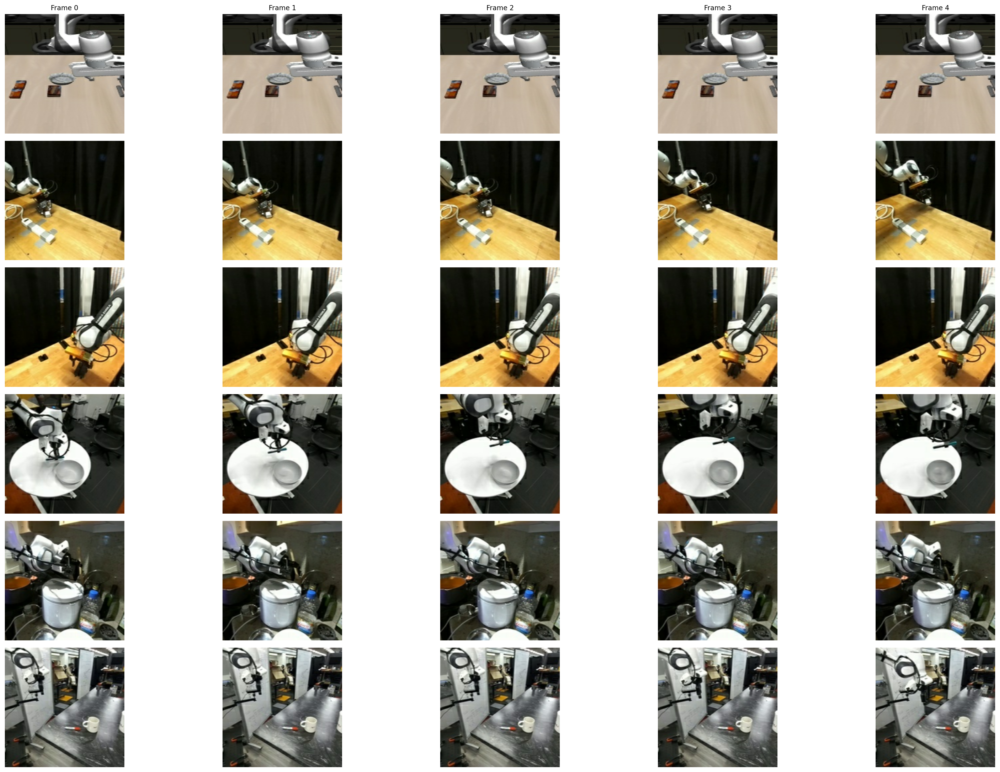

In [9]:
batch = next(iter(train_loader))
visualize_batch_videos(batch, num_samples=20,denorm=True)

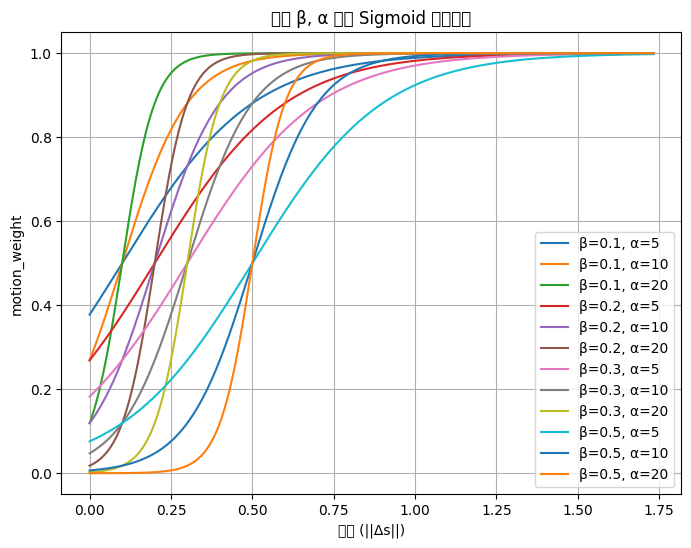

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def motion_weight_curve(magnitudes, alpha, beta):
    """计算 motion_weight = sigmoid(alpha * (magnitude - beta))"""
    return 1 / (1 + np.exp(-alpha * (magnitudes - beta)))

# 模长范围 [0, sqrt(3)] ≈ [0, 1.73]
magnitudes = np.linspace(0, np.sqrt(3), 500)

# 参数设置
betas = [0.1,0.2, 0.3, 0.5]        # 不同阈值
alphas = [5, 10, 20]           # 不同陡峭度

plt.figure(figsize=(8, 6))

# 绘制曲线
for beta in betas:
    for alpha in alphas:
        weights = motion_weight_curve(magnitudes, alpha, beta)
        plt.plot(magnitudes, weights, label=f"β={beta}, α={alpha}")

plt.xlabel("模长 (||Δs||)")
plt.ylabel("motion_weight")
plt.title("不同 β, α 下的 Sigmoid 权重曲线")
plt.legend()
plt.grid(True)
plt.show()
plt.close()


In [25]:

import tensorflow_datasets as tfds
import tqdm
import matplotlib.pyplot as plt
import numpy as np

In [26]:
rlds_dir='/mnt/public_zgc/home/jlchen/datasets/calvin_abc_rlds/1.0.0'
ds_builder = tfds.builder_from_directory(rlds_dir)
dataset = ds_builder.as_dataset(split='all')

ds_length = len(dataset)
dataset = dataset.take(ds_length)
it = iter(dataset)

def visualize_images(step, step_idx):
    """可视化单个步骤的4个图像"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(f'Step {step_idx} - 4个视角的图像', fontsize=16)
    
    # 获取4个图像
    images = [
        step['observation']['rgb_gripper'],
        step['observation']['rgb_static'], 
    ]
    

    titles = [
        "Gripper",
        "Static",
    ]
    for idx, (img, title) in enumerate(zip(images, titles)):
        row = idx // 2
        col = idx % 2
        
        # 转换图像格式用于显示
        if hasattr(img, 'numpy'):
            img_array = img.numpy()
        else:
            img_array = np.array(img)
        
        # 确保图像是uint8格式
        if img_array.dtype != np.uint8:
            if img_array.max() <= 1.0:
                img_array = (img_array * 255).astype(np.uint8)
            else:
                img_array = img_array.astype(np.uint8)
        
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(title)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# 只处理前几个episode和步骤进行可视化
for i in tqdm.tqdm(range(min(2, ds_length))):  # 只处理前2个episode
    episode = next(it)
    print(f"Episode {i}:")
    steps = episode['steps']
    print("Episode keys: ", episode.keys())

    # 只处理前3个步骤
    for j, step in enumerate(steps.take(3)):
        print(f"\n--- Step {j} ---")
        print(f"Action: {step['action']}")
        print(f"State: {step['observation']['state']}")
        
        # 可视化图像
        visualize_images(step, j)
        

        


FileNotFoundError: Could not load dataset info from /mnt/public_zgc/home/jlchen/datasets/calvin_abc_rlds/1.0.0/dataset_info.json

  0%|                                                                                                                                                           | 0/2 [00:00<?, ?it/s]

Episode 0:
Episode keys:  dict_keys(['episode_metadata', 'steps'])

--- Step 0 ---
Action: [ 0.01607143  0.         -0.          0.          0.         -0.
 -1.        ]
State: [-5.3380046e-02  7.0296312e-03  6.7832810e-01  3.1407692e+00
  1.7593271e-03 -8.9944184e-02  3.8788661e-02 -3.8787212e-02]


/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 20010 (\N{CJK UNIFIED IDEOGRAPH-4E2A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 35270 (\N{CJK UNIFIED IDEOGRAPH-89C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 35282 (\N{CJK UNIFIED IDEOGRAPH-89D2}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_396468/1292662222.py:44: UserWarning: Glyph 20687 (\N{CJK UNIFIED IDEOGRAPH-50CF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/mnt/public_zgc/home/jlchen/vla/lib/python3.10/site-packages/IPython/core/pylabtoo

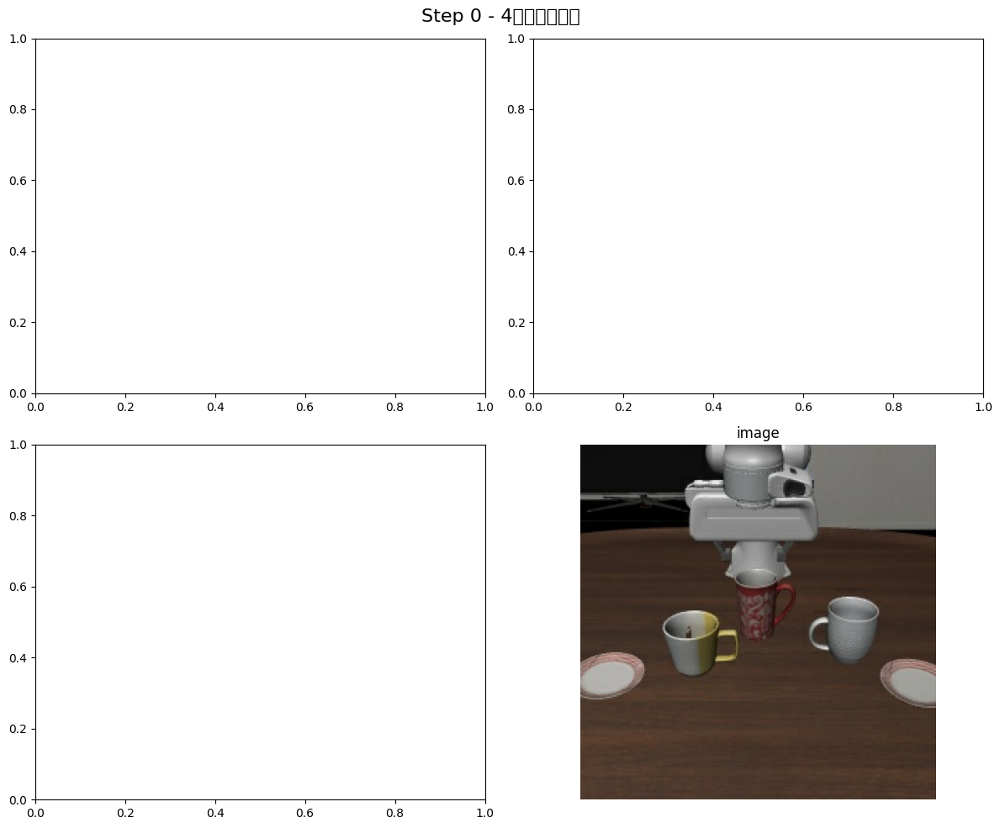


--- Step 1 ---
Action: [ 0.01339286  0.         -0.          0.          0.         -0.
 -1.        ]
State: [-5.3311408e-02  7.0271161e-03  6.7832285e-01  3.1407702e+00
  1.7220743e-03 -8.9667469e-02  3.8882121e-02 -3.8880840e-02]


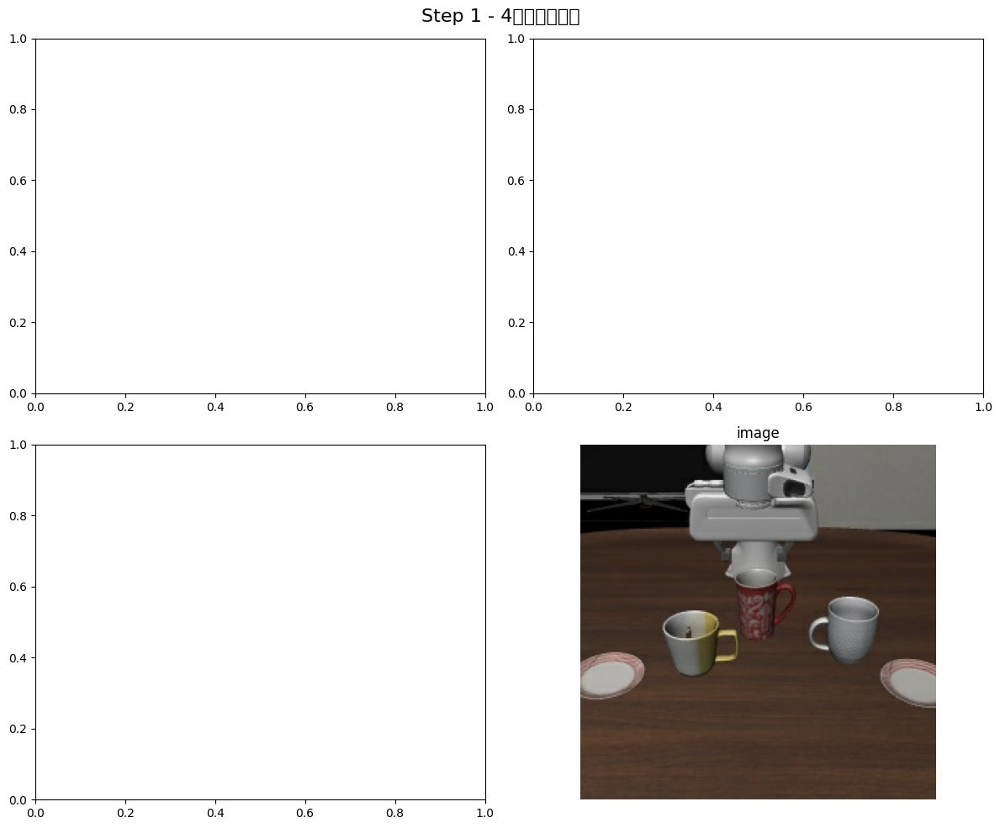


--- Step 2 ---
Action: [ 0.00267857  0.         -0.          0.          0.         -0.
 -1.        ]
State: [-5.3207424e-02  7.0241750e-03  6.7829674e-01  3.1407754e+00
  1.6997836e-03 -8.9343503e-02  3.8936380e-02 -3.8935188e-02]


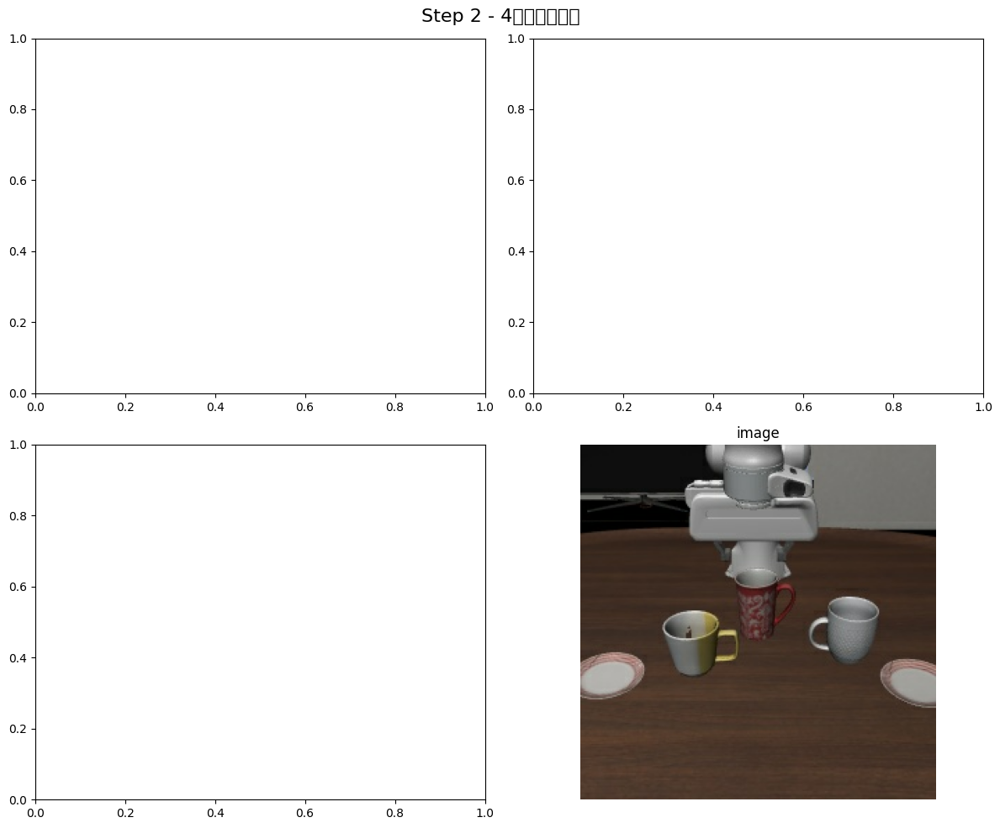

 50%|█████████████████████████████████████████████████████████████████████████▌                                                                         | 1/2 [00:01<00:01,  1.09s/it]

Episode 1:
Episode keys:  dict_keys(['episode_metadata', 'steps'])

--- Step 0 ---
Action: [ 0.          0.         -0.          0.          0.00214286 -0.
 -1.        ]
State: [-5.9941780e-02 -5.5145081e-03  6.8339139e-01  3.1400671e+00
 -3.5166318e-04 -9.0389296e-02  3.8787592e-02 -3.8788270e-02]


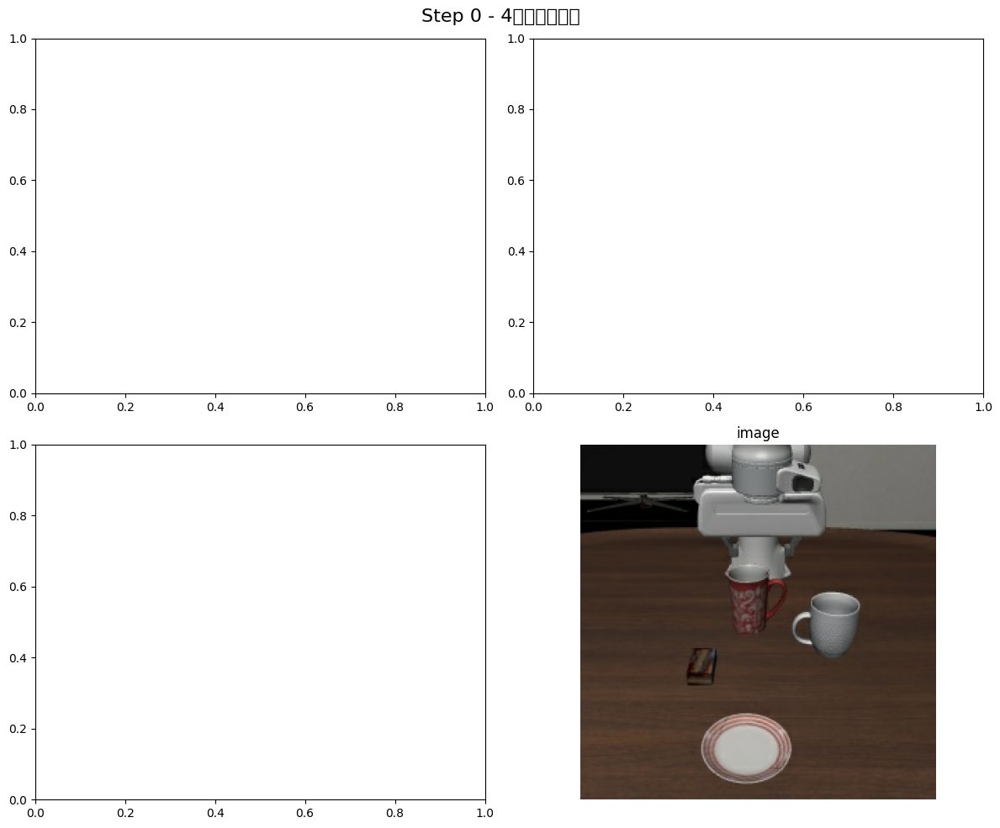


--- Step 1 ---
Action: [ 0.          0.         -0.          0.          0.00535714 -0.
 -1.        ]
State: [-5.9948117e-02 -5.4886607e-03  6.8338662e-01  3.1400981e+00
 -2.6704310e-04 -9.0438075e-02  3.8880918e-02 -3.8882036e-02]


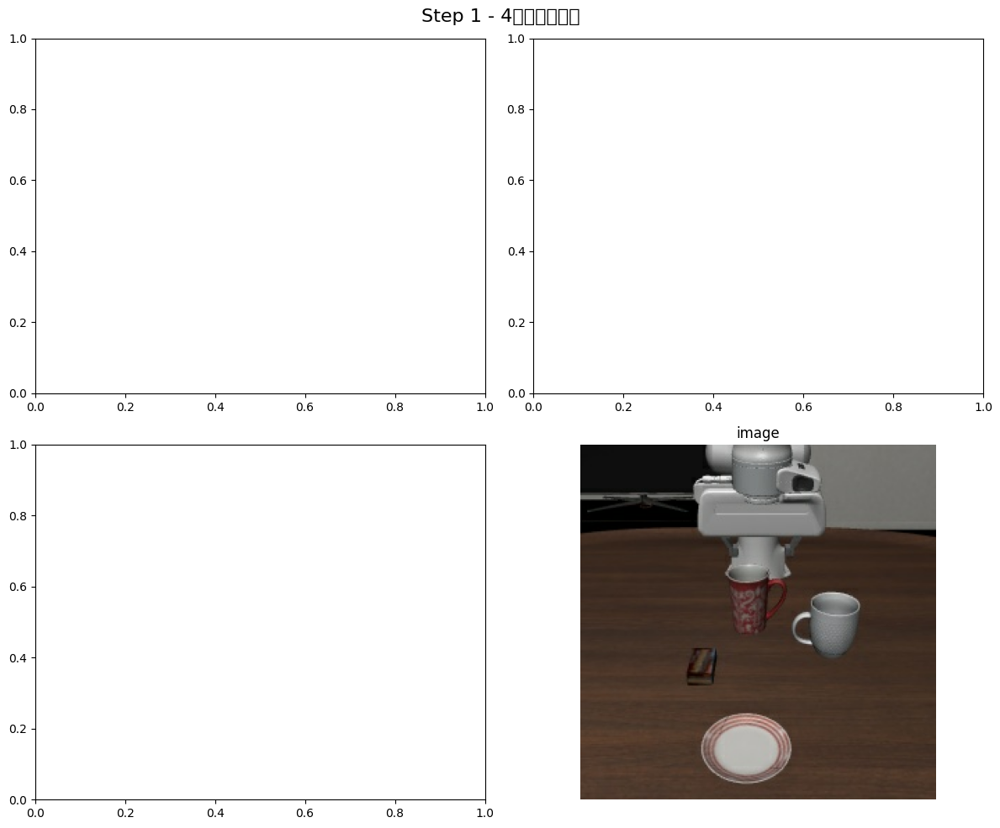


--- Step 2 ---
Action: [ 0.      0.     -0.      0.      0.0075 -0.     -1.    ]
State: [-5.9991311e-02 -5.4718964e-03  6.8335360e-01  3.1401193e+00
 -2.1624920e-04 -9.0788998e-02  3.8935244e-02 -3.8936317e-02]


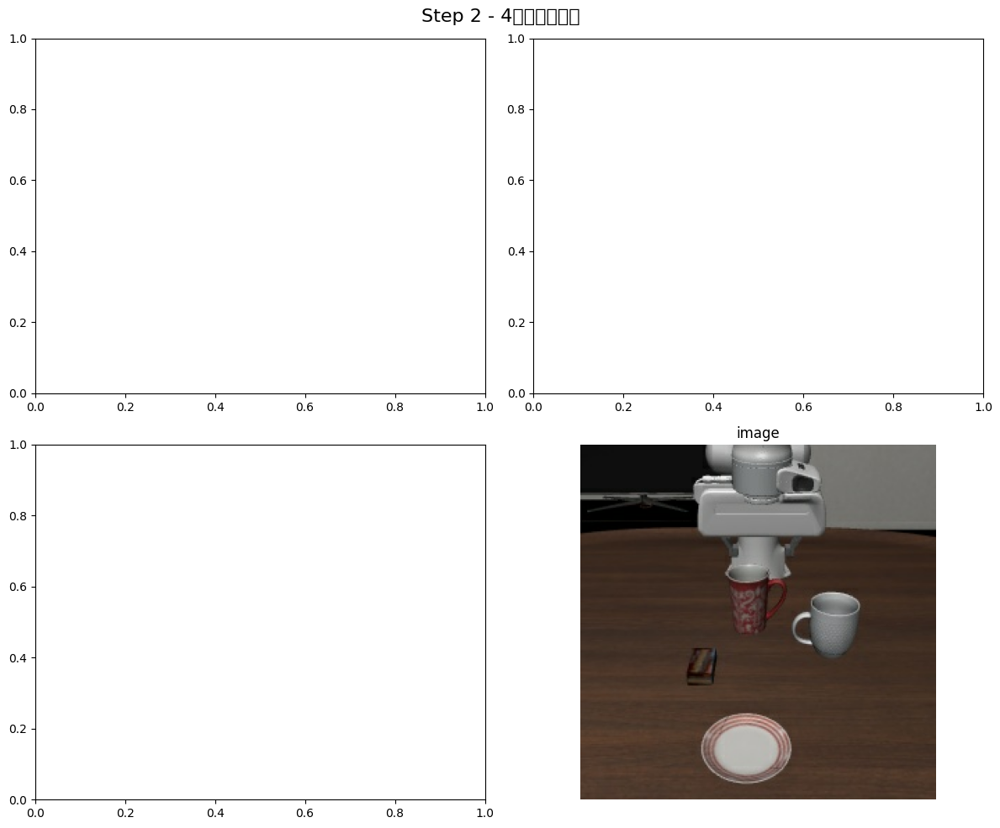

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.01it/s]


In [ ]:
rlds_dir='/mnt/public_zgc/home/jlchen/datasets/libero_10_no_noops/1.0.0'
ds_builder = tfds.builder_from_directory(rlds_dir)
dataset = ds_builder.as_dataset(split='all')

ds_length = len(dataset)
dataset = dataset.take(ds_length)
it = iter(dataset)

def visualize_images(step, step_idx):
    """可视化单个步骤的4个图像"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(f'Step {step_idx} - 4个视角的图像', fontsize=16)
    
    # 获取4个图像
    images = [
        step['observation']['image'],
    ]
    

    titles = [
        "image",
    ]
    for idx, (img, title) in enumerate(zip(images, titles)):
        row = 1
        col = 1
        
        # 转换图像格式用于显示
        if hasattr(img, 'numpy'):
            img_array = img.numpy()
        else:
            img_array = np.array(img)
        
        # 确保图像是uint8格式
        if img_array.dtype != np.uint8:
            if img_array.max() <= 1.0:
                img_array = (img_array * 255).astype(np.uint8)
            else:
                img_array = img_array.astype(np.uint8)
        
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(title)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# 只处理前几个episode和步骤进行可视化
for i in tqdm.tqdm(range(min(2, ds_length))):  # 只处理前2个episode
    episode = next(it)
    print(f"Episode {i}:")
    steps = episode['steps']
    print("Episode keys: ", episode.keys())

    # 只处理前3个步骤
    for j, step in enumerate(steps.take(3)):
        print(f"\n--- Step {j} ---")
        print(f"Action: {step['action']}")
        print(f"State: {step['observation']['state']}")
        
        # 可视化图像
        visualize_images(step, j)
        

        


10/13 [22:58:11] INFO     | >> Load dataset info from                                           ]8;id=942590;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=375190;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

                 INFO     | >> Constructing tf.data.Dataset bridge_dataset for split all, from ]8;id=107786;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=370858;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0                                     

总共有 60064 个 episode 可采样

=== Episode 0 (全局索引 51125) ===
该 episode 总共有 44 个时间步
随机采样的时间步索引：[26, 35, 39]

--- Step 26 ---
Action: tf.Tensor(
[ 0.00103054 -0.00226389 -0.00391461 -0.01894942  0.01091565 -0.00372303
  1.        ], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.28609493  0.12960784  0.03048943 -0.08570437  0.11177643  0.04328899
  0.07494326], shape=(7,), dtype=float32)


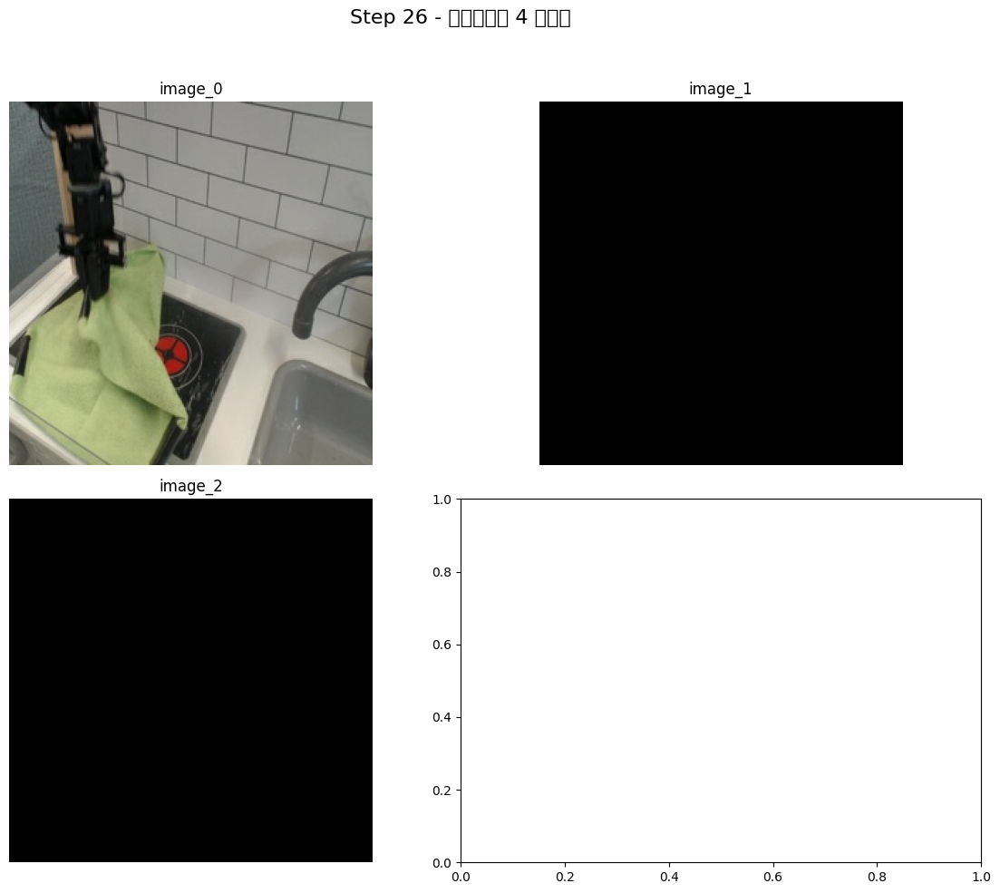


--- Step 35 ---
Action: tf.Tensor([0. 0. 0. 0. 0. 0. 1.], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.29745895  0.10610207  0.08631731 -0.12047191 -0.03231643  0.07421587
  0.99815464], shape=(7,), dtype=float32)


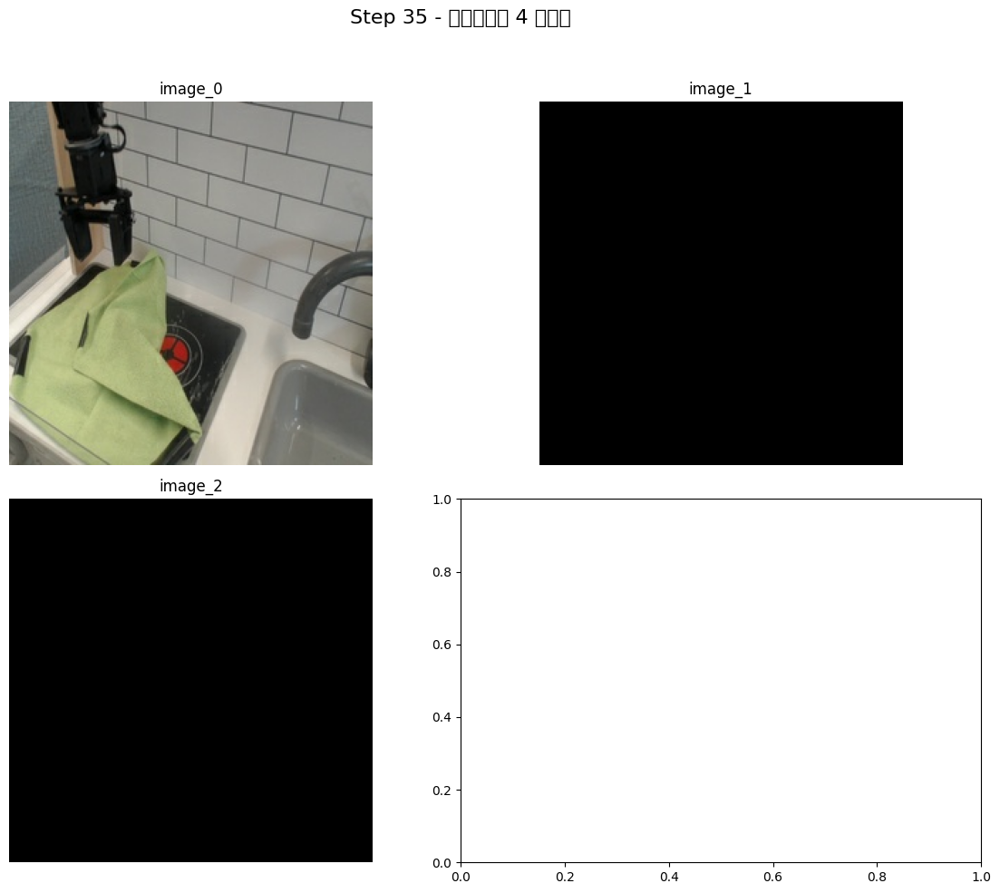


--- Step 39 ---
Action: tf.Tensor([0. 0. 0. 0. 0. 0. 1.], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.29728496  0.1055495   0.08602735 -0.12340521 -0.03252225  0.06952059
  0.99815464], shape=(7,), dtype=float32)


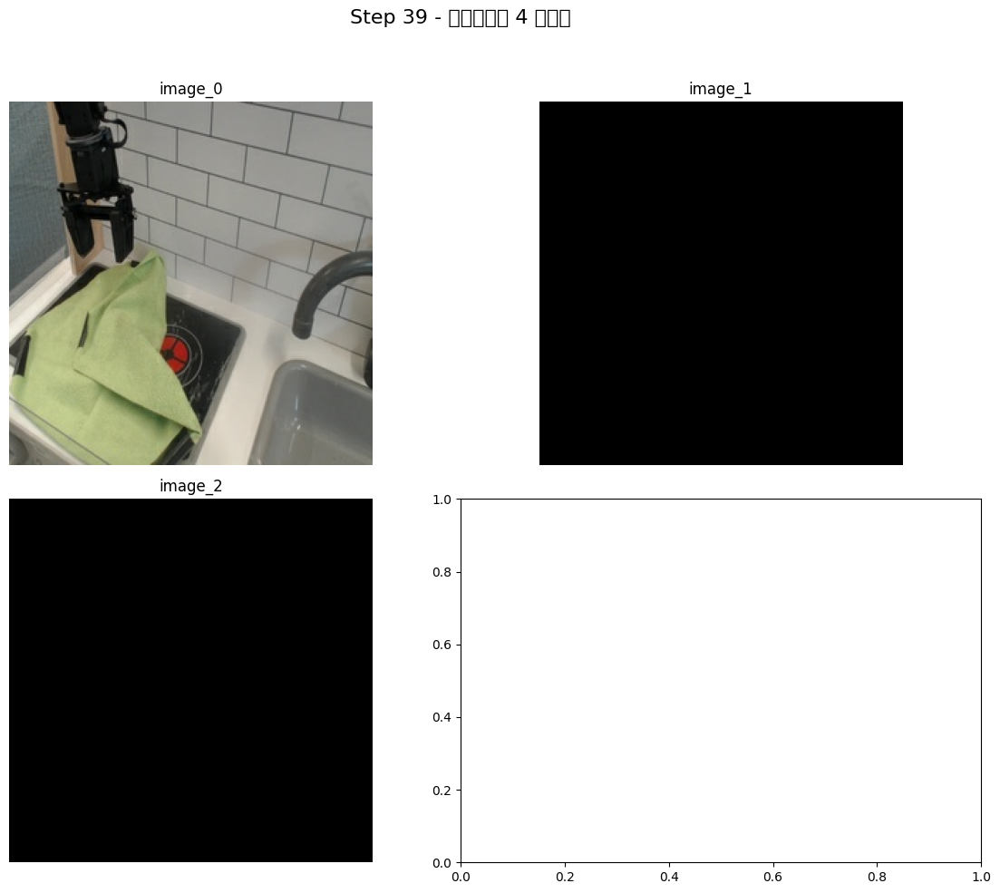


=== Episode 1 (全局索引 49117) ===
该 episode 总共有 47 个时间步
随机采样的时间步索引：[9, 10, 15]

--- Step 9 ---
Action: tf.Tensor(
[ 1.9384309e-04  3.4684492e-03  3.2639506e-03 -5.7910802e-03
 -4.8924282e-02  5.6316715e-02  1.0000000e+00], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.21989837 -0.10001475  0.18342255  0.0174105   0.08399624  0.538214
  0.9994886 ], shape=(7,), dtype=float32)


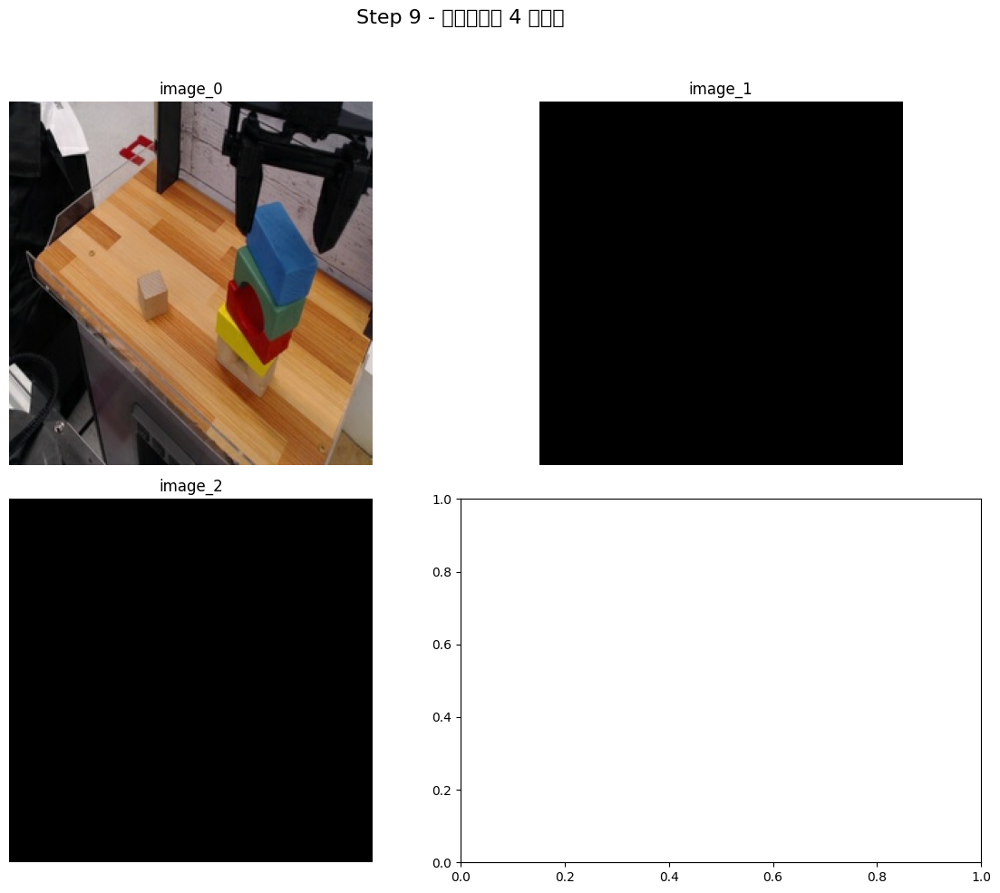


--- Step 10 ---
Action: tf.Tensor(
[ 0.00961774  0.003004   -0.00149818 -0.01137956 -0.03861427  0.05797472
  1.        ], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.22328943 -0.0978432   0.1797015   0.0185131   0.05812366  0.5990437
  0.9994886 ], shape=(7,), dtype=float32)


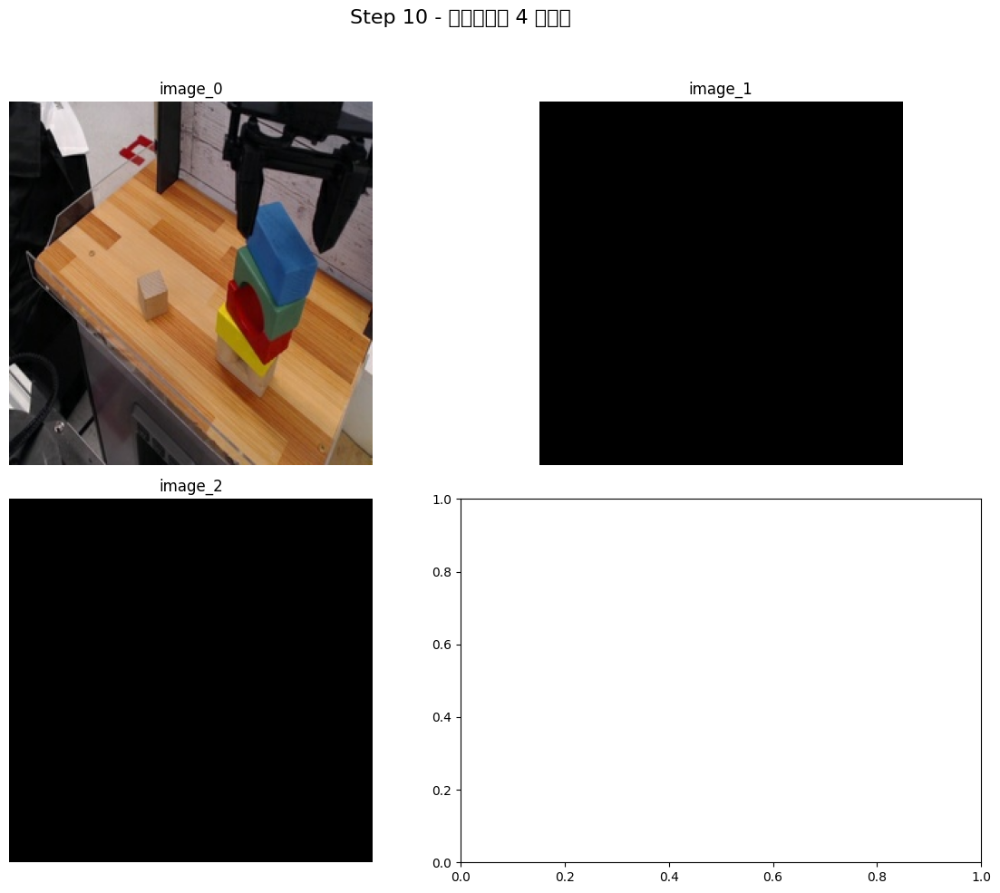


--- Step 15 ---
Action: tf.Tensor(
[-0.00571329  0.00229077 -0.00792899 -0.01305909  0.00080832  0.02770978
  0.        ], shape=(7,), dtype=float32)
State: tf.Tensor(
[ 0.23773597 -0.09900393  0.16660653 -0.10344354  0.01917946  0.810662
  0.9994886 ], shape=(7,), dtype=float32)


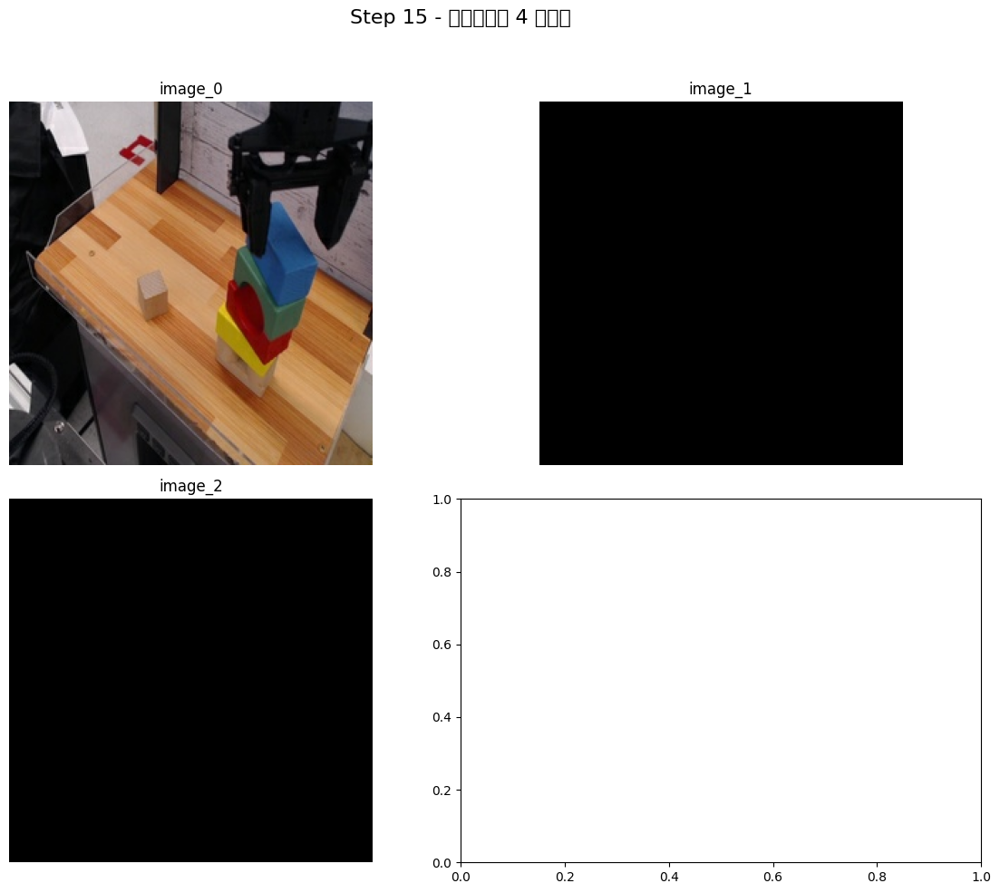

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import tqdm
import matplotlib.pyplot as plt
import numpy as np
import random

rlds_dir = '/mnt/mnt/public/jlchen/datasets/bridge_dataset/1.0.0'
ds_builder = tfds.builder_from_directory(rlds_dir)
dataset = ds_builder.as_dataset(split='all')

# 获取数据集长度
num_episodes = ds_builder.info.splits['all'].num_examples
print(f"总共有 {num_episodes} 个 episode 可采样")

def _maybe_decode_image(img):
    if isinstance(img, tf.Tensor) and img.dtype == tf.string:
        img = tf.io.decode_image(img, channels=3, expand_animations=False)
    if hasattr(img, "numpy"):
        img_array = img.numpy()
    else:
        img_array = np.array(img)
    if img_array.ndim == 2:
        img_array = np.stack([img_array]*3, axis=-1)
    if img_array.dtype != np.uint8:
        if img_array.max() <= 1.0:
            img_array = (img_array * 255).astype(np.uint8)
        else:
            img_array = img_array.astype(np.uint8)
    return img_array

def visualize_images(step, step_idx):
    images = [
        step['observation']['image_0'],
        step['observation']['image_1'],
        step['observation']['image_2'],
        step['observation']['image_3'],
    ]
    titles = ["image_0", "image_1", "image_2", "image_3"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(f'Step {step_idx} - 随机采样的 4 个视角', fontsize=16)

    for idx, (img, title) in enumerate(zip(images, titles)):
        row, col = divmod(idx, 2)
        try:
            img_array = _maybe_decode_image(img)
        except Exception as e:
            axes[row, col].text(0.5, 0.5, f"Error\n{e}", ha='center')
            axes[row, col].axis('off')
            continue
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(title)
        axes[row, col].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# ===== 随机采样 =====
num_episodes_to_sample = 2  # 每次随机采样多少轨迹
num_steps_to_sample = 3     # 每条轨迹随机采样多少时间步

for i in range(num_episodes_to_sample):
    # 随机选择 episode 索引
    episode_idx = random.randint(0, num_episodes - 1)
    print(f"\n=== Episode {i} (全局索引 {episode_idx}) ===")
    
    # 用 skip + take(1) 获取随机 episode
    episode = next(iter(dataset.skip(episode_idx).take(1)))
    steps = list(episode['steps'])
    num_steps = len(steps)
    print(f"该 episode 总共有 {num_steps} 个时间步")

    # 随机采样时间步
    if num_steps >= num_steps_to_sample:
        sampled_indices = random.sample(range(num_steps), num_steps_to_sample)
    else:
        sampled_indices = list(range(num_steps))
    sampled_indices.sort()
    print(f"随机采样的时间步索引：{sampled_indices}")

    for j in sampled_indices:
        step = steps[j]
        print(f"\n--- Step {j} ---")
        print("Action:", step['action'])
        print("State:", step['observation']['state'])
        visualize_images(step, j)


10/13 [23:03:15] INFO     | >> Load dataset info from                                           ]8;id=457592;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py\dataset_info.py]8;;\:]8;id=635656;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/dataset_info.py#599\599]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid_100/1.0.0                                          

                 INFO     | >> Constructing tf.data.Dataset r2d2_faceblur for split all, from  ]8;id=604596;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py\logging_logger.py]8;;\:]8;id=199312;file:///usr/local/miniconda3/envs/vla/lib/python3.10/site-packages/tensorflow_datasets/core/logging/logging_logger.py#49\49]8;;\
                          /mnt/mnt/public/jlchen/datasets/droid_100/1.0.0                                          

总共有 100 个 episode 可采样

=== Episode 0 (全局索引 32) ===
该 episode 总共有 207 个时间步
随机采样的时间步索引：[11, 111, 181]

--- Step 11 ---
Action: tf.Tensor(
[ 0.37085256 -0.02441427  0.39506975 -3.05390382 -0.19203354  0.11187947
  0.        ], shape=(7,), dtype=float64)


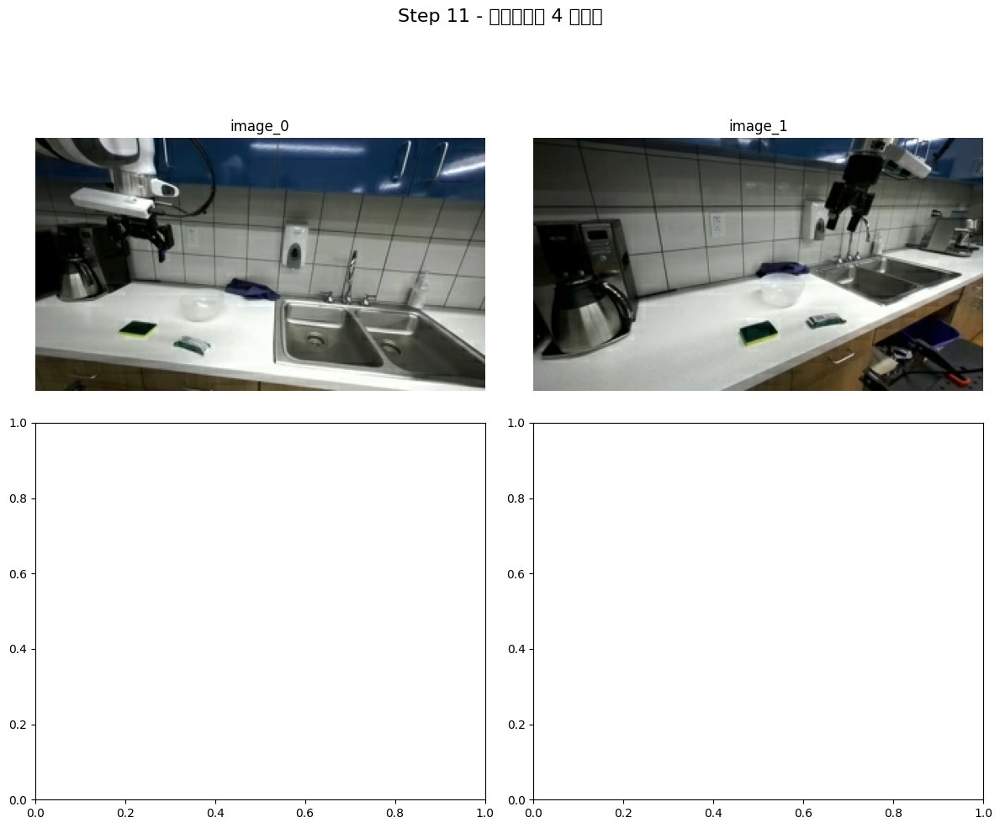


--- Step 111 ---
Action: tf.Tensor(
[ 4.95887488e-01 -7.77709484e-02  8.72124210e-02  3.06154537e+00
  2.31675128e-03 -1.32450092e+00  0.00000000e+00], shape=(7,), dtype=float64)


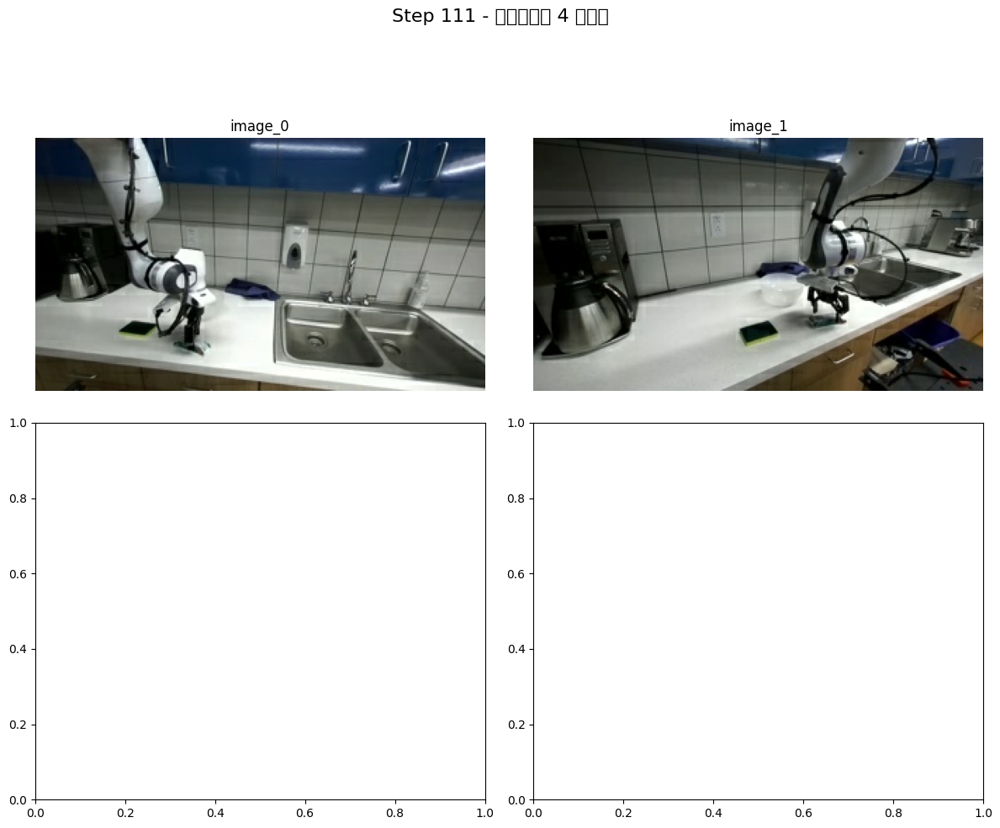


--- Step 181 ---
Action: tf.Tensor(
[ 0.61228436 -0.04482377  0.21995269 -2.88544965 -0.11571633 -1.296435
  0.        ], shape=(7,), dtype=float64)


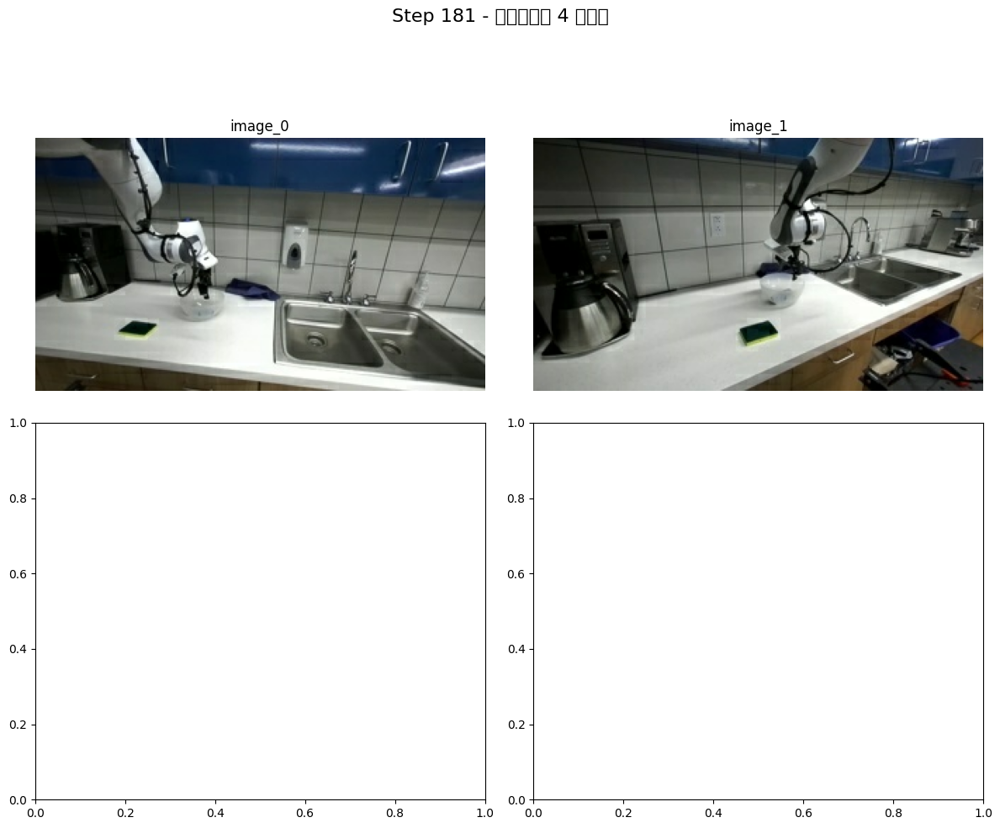


=== Episode 1 (全局索引 0) ===
该 episode 总共有 166 个时间步
随机采样的时间步索引：[50, 133, 137]

--- Step 50 ---
Action: tf.Tensor(
[ 0.61882102  0.14156805  0.16488899  3.02711439  0.10855611 -0.12145783
  0.        ], shape=(7,), dtype=float64)


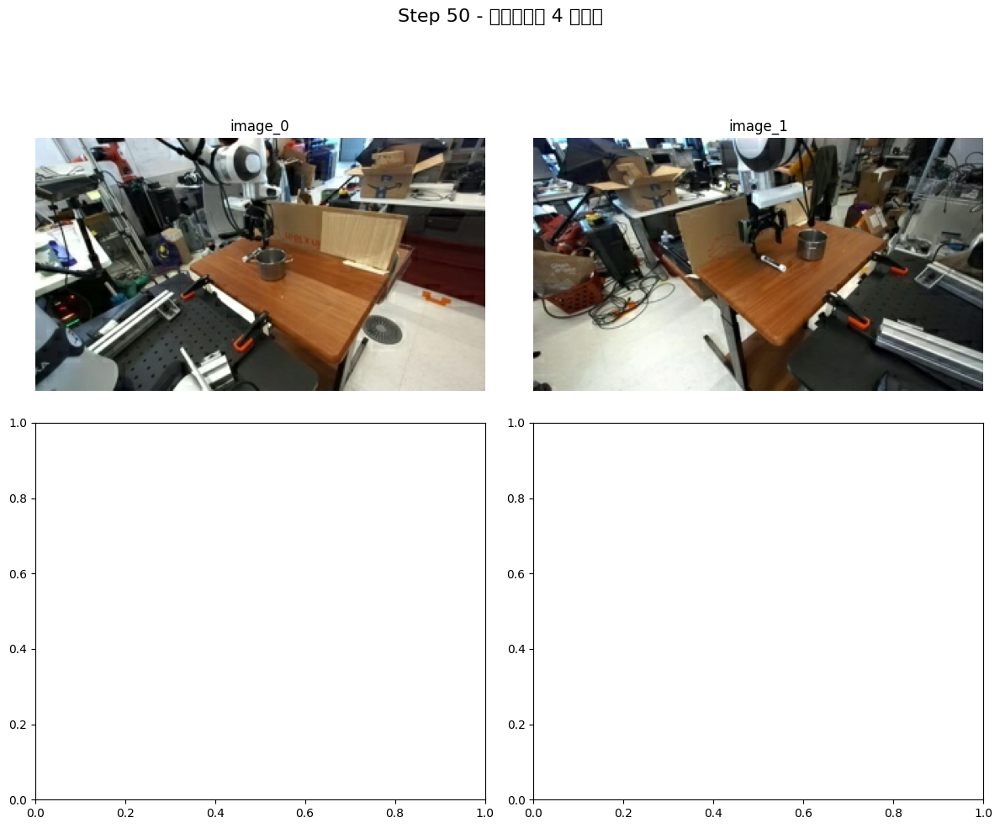


--- Step 133 ---
Action: tf.Tensor(
[ 0.50918293  0.03418854  0.21261814  2.94002247 -0.35920426  0.19545211
  0.54295152], shape=(7,), dtype=float64)


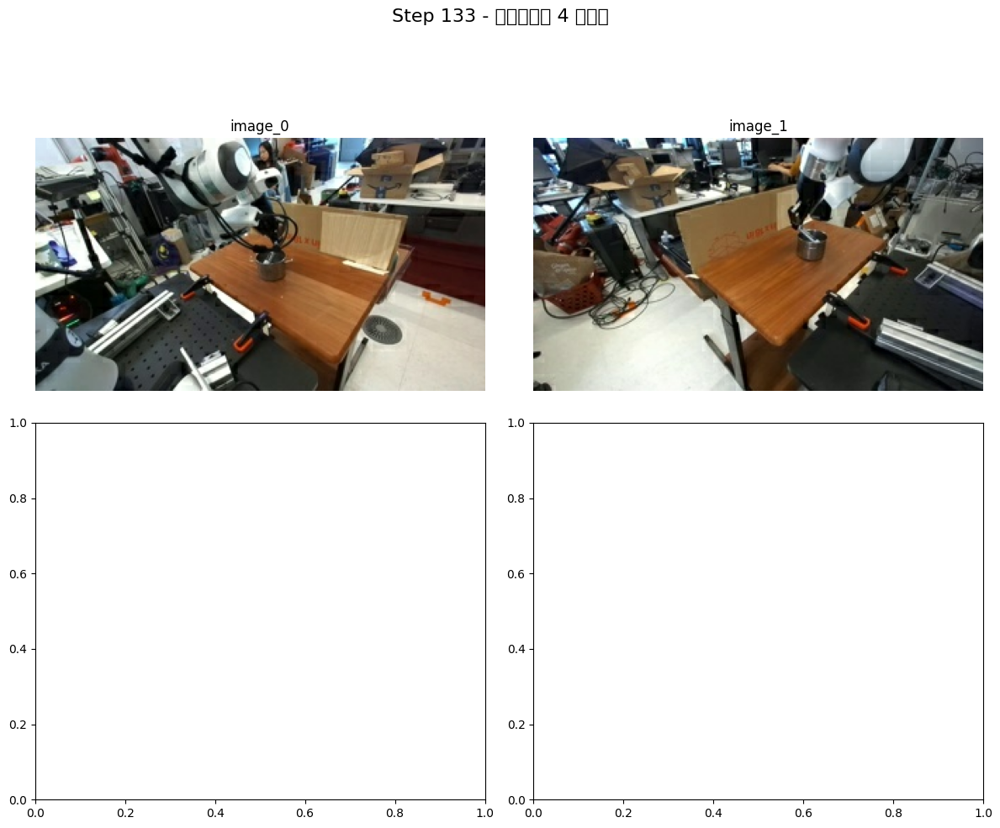


--- Step 137 ---
Action: tf.Tensor(
[ 0.50992447  0.0347872   0.21281713  2.94218683 -0.35500416  0.19231355
  0.2654185 ], shape=(7,), dtype=float64)


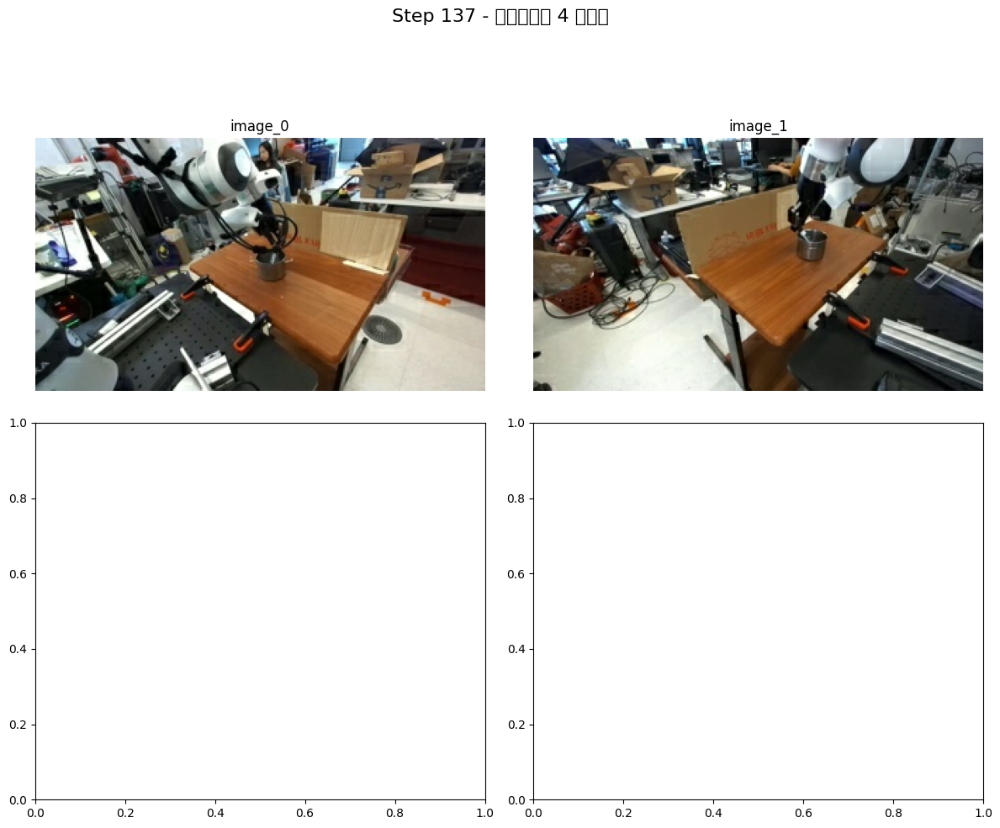

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import tqdm
import matplotlib.pyplot as plt
import numpy as np
import random

rlds_dir = '/mnt/mnt/public/jlchen/datasets/droid_100/1.0.0'
ds_builder = tfds.builder_from_directory(rlds_dir)
dataset = ds_builder.as_dataset(split='all')

# 获取数据集长度
num_episodes = ds_builder.info.splits['all'].num_examples
print(f"总共有 {num_episodes} 个 episode 可采样")

def _maybe_decode_image(img):
    if isinstance(img, tf.Tensor) and img.dtype == tf.string:
        img = tf.io.decode_image(img, channels=3, expand_animations=False)
    if hasattr(img, "numpy"):
        img_array = img.numpy()
    else:
        img_array = np.array(img)
    if img_array.ndim == 2:
        img_array = np.stack([img_array]*3, axis=-1)
    if img_array.dtype != np.uint8:
        if img_array.max() <= 1.0:
            img_array = (img_array * 255).astype(np.uint8)
        else:
            img_array = img_array.astype(np.uint8)
    return img_array
def visualize_images(step, step_idx):
    images = [
        step['observation']["exterior_image_1_left"],
        step['observation']["exterior_image_2_left"],
        # step['observation']["wrist_image_left",],
        # step['observation']['image_3'],
    ]
    titles = ["image_0", "image_1", "image_2", "image_3"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(f'Step {step_idx} - 随机采样的 4 个视角', fontsize=16)

    for idx, (img, title) in enumerate(zip(images, titles)):
        row, col = divmod(idx, 2)
        try:
            img_array = _maybe_decode_image(img)
        except Exception as e:
            axes[row, col].text(0.5, 0.5, f"Error\n{e}", ha='center')
            axes[row, col].axis('off')
            continue
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(title)
        axes[row, col].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# ===== 随机采样 =====
num_episodes_to_sample = 2  # 每次随机采样多少轨迹
num_steps_to_sample = 3     # 每条轨迹随机采样多少时间步

for i in range(num_episodes_to_sample):
    # 随机选择 episode 索引
    episode_idx = random.randint(0, num_episodes - 1)
    print(f"\n=== Episode {i} (全局索引 {episode_idx}) ===")
    
    # 用 skip + take(1) 获取随机 episode
    episode = next(iter(dataset.skip(episode_idx).take(1)))
    steps = list(episode['steps'])
    num_steps = len(steps)
    print(f"该 episode 总共有 {num_steps} 个时间步")

    # 随机采样时间步
    if num_steps >= num_steps_to_sample:
        sampled_indices = random.sample(range(num_steps), num_steps_to_sample)
    else:
        sampled_indices = list(range(num_steps))
    sampled_indices.sort()
    print(f"随机采样的时间步索引：{sampled_indices}")

    for j in sampled_indices:
        step = steps[j]
        print(f"\n--- Step {j} ---")
        print("Action:", step['action'])
        # print("State:", step['observation']['state'])
        visualize_images(step, j)


In [ ]:
import torch
from torch.nn.functional import scaled_dot_product_attention

print("FlashAttention 可用:", torch.backends.cuda.flash_sdp_enabled())

q = torch.randn(1, 8, 128, 64, device="cuda", dtype=torch.bfloat16)
k = torch.randn(1, 8, 128, 64, device="cuda", dtype=torch.bfloat16)
v = torch.randn(1, 8, 128, 64, device="cuda", dtype=torch.bfloat16)

# 显示当前可用的 kernel 组合
with torch.backends.cuda.sdp_kernel(enable_flash=True, enable_mem_efficient=False, enable_math=False):
    out = scaled_dot_product_attention(q, k, v, is_causal=True)
    print("输出 shape:", out.shape)



FlashAttention 可用: True
输出 shape: torch.Size([1, 8, 128, 64])


In [ ]:
import json
import os
from dataclasses import dataclass, field, asdict
from pathlib import Path
from typing import Optional, Tuple, Union, Dict, Any
from datetime import datetime

import torch
import torch.distributed as dist
import yaml
from latent_action_model.core.lam_model import load_latent_action_model
from prismatic.overwatch import initialize_overwatch
from prismatic.util import set_global_seed
from prismatic.vla import get_latent_vla_dataset_and_collator
from prismatic.vla.datasets.datasets import RLDSDataset
from prismatic.models import load_InternVL,freeze_internvl
from prismatic.vla.datasets.rlds.utils.data_utils import save_dataset_statistics
from typing import cast
from prismatic.training.accelerate_fsdp_trainer import run_latent_action_training
from transformers import AutoProcessor

# Sane Defaults
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")


# Initialize Overwatch =>> Wraps `logging.Logger`
overwatch = initialize_overwatch(__name__)

# 📝 动作 token 列表: ['<ACT_0>', '<ACT_1>', '<ACT_2>', '<ACT_3>', '<ACT_4>', '<ACT_5>', '<ACT_6>', '<ACT_7>', '<ACT_8>', '<ACT_9>', '<ACT_10>', '<ACT_11>', '<ACT_12>', '<ACT_13>', '<ACT_14>', '<ACT_15>']
# 🔢 对应的 token ID: [151679, 151680, 151681, 151682, 151683, 151684, 151685, 151686, 151687, 151688, 151689, 151690, 151691, 151692, 151693, 151694]
# 🎯 action_token_begin_id = 151679
# 📊 ID 范围: 151679 - 151694

@dataclass
class TrainConfig:
    # fmt: off

    # =========================
    # 路径与资源
    # =========================
    # Directory Paths
    data_root_dir: Path = Path("/mnt/public_zgc/home/jlchen/datasets")
    run_root_dir: Path = Path(__file__).resolve().parent / "vla_log"    # Store logs & checkpoints under vla_scripts/

    # Hugging Face 模型标识（或本地权重目录）；用于 PrismaticVLM.from_pretrained()
    model_id: str = '/mnt/public_zgc/home/jlchen/weights/InternVL3_5-1B-Instruct-HF'
    hf_cache_dir: Optional[Path] = None
    lam_path: str = "/mnt/public_zgc/home/jlchen/code/UniVLA/latent_action_model/logs/version_1/checkpoints/epoch=49_step=50000.ckpt"

    # =========================
    # 数据与预处理
    # =========================
    # 数据混合与缓冲
    data_mix: str = "droid_100"
    shuffle_buffer_size: int = 20_00
    image_resolution: int = 448
    image_aug: bool = True                                          # Whether to enable image augmentations

    # =========================
    # 模型冻结策略
    # =========================
    # 冻结策略
    freeze_vision_backbone: bool = False
    freeze_llm_backbone: bool = False
    freeze_last_llm_layer: bool = False
    freeze_projector: bool = False

    # =========================
    # LAM / 动作离散参数
    # =========================
    action_token_begin_id: int = 151679
    # VJEPA_LAM 模型架构参数
    vision_model_id: str = "/mnt/public_zgc/home/jlchen/weights/vjepa2-vitl-fpc64-256"
    codebook_size: int = 16  #此处修改无效，仅作为标记
    # =========================
    # 训练设置
    # =========================
    # 训练超参
    epochs: Optional[int] = 10
    max_steps: Optional[int] = 200000  #以max_steps为准，若为空则按epochs * 10000近似
    per_device_batch_size: int = 4
    gradient_accumulation_steps: int = 1
    learning_rate: float = 2e-3
    warmup_steps: int = 1000
    weight_decay: float = 0.0
    max_grad_norm: float = 1.0
    lr_scheduler_type: str = "constant"   #constant_with_warmup
    # 训练加速
    enable_mixed_precision_training: bool = True
    seed: int = 42                                                  # Random seed (for reproducibility)

    # =========================
    # 评估与保存
    # =========================
    eval_strategy: str = "steps"
    save_total_limit: int = -1
    eval_interval: int = 4
    eval_accumulation_steps: int = 1
    per_device_eval_batch_size: int = 8
    save_interval: int = 1000                                    # Interval for saving checkpoints (in steps

    # =========================
    # 分布式 / FSDP
    # =========================
    fsdp: Optional[str] = "full_shard"                     # 示例："full_shard auto_wrap" 或 None 关闭
    fsdp_config: Optional[Dict[str, Any]] = None   # 示例：{"fsdp_min_num_params": 1e7, "xla": False}

    # =========================
    # 运行与日志
    # =========================
    # Run Arguments
    run_id: Optional[str] =  None                                  # Run ID for logging, Weights & Biases
    run_id_note: Optional[str] = "run_01"                               # Extra note for logging, Weights & Biases
    # Tracking Parameters
    wandb_project: str = "vla_pretraining"                   # Name of W&B project to log to (use default!)
    # wandb_entity: str = "opendrivelab"                              # Name of entity to log under

    # =========================
    # 恢复 / 断点（仅用于日志标记，不再用于模型权重加载）
    # =========================
    # Resume (logging) Parameters -- 仅用于日志标记，不再用于模型权重加载
    resume_step: Optional[int] = None
    resume_epoch: Optional[int] = None

    # =========================
    # HF Hub 凭据（如有门限模型）
    # =========================
    # HF Hub Credentials (for any gated models)
    hf_token: Optional[str] = None

    # fmt: on

cfg=TrainConfig

overwatch.info("OpenVLA Training :: Warming Up")

# Note => Under `torchrun` initializing `overwatch` will automatically set up `torch.distributed`
torch.cuda.set_device(device_id := overwatch.local_rank())
torch.cuda.empty_cache()

# Configure Unique Run Name & Save Directory
vla_tag = f"{cfg.model_id.split('/')[-1]}+{cfg.data_mix}"
world_size = overwatch.world_size() if dist.is_initialized() else max(torch.cuda.device_count(), 1)
overwatch.info(f"Detected world_size = {world_size}")
cfg.run_id = (
    f"{vla_tag}+n{world_size}+b{cfg.per_device_batch_size}+x{cfg.seed}"
    if cfg.run_id is None
    else cfg.run_id
)
if cfg.run_id_note is not None:
    cfg.run_id += f"--{cfg.run_id_note}"
if cfg.image_aug:
    cfg.run_id += "--image_aug"

# cfg.run_id += '-Latent-Action-Pretraining'
# Start =>> Build Directories and Set Randomness
overwatch.info('"Do or do not; there is no try."', ctx_level=1)
# hf_token = cfg.hf_token.read_text().strip() if isinstance(cfg.hf_token, Path) else os.environ[cfg.hf_token]
hf_token = str(cfg.hf_token) if isinstance(cfg.hf_token, Path) else cfg.hf_token
worker_init_fn = set_global_seed(cfg.seed, get_worker_init_fn=True)
# 统一时间戳并广播，确保所有进程共用同一目录
if dist.is_initialized():
    if overwatch.is_rank_zero():
        ts: Optional[str] = datetime.now().strftime("%m%d_%H%M%S")
    else:
        ts = None
    obj_list = [ts]
    dist.broadcast_object_list(obj_list, src=0)
    timestamp = obj_list[0]
    assert isinstance(timestamp, str)
else:
    timestamp = datetime.now().strftime("%m%d_%H%M%S")

run_dir_name = f"{timestamp}+{cfg.run_id}"
run_dir = (cfg.run_root_dir / run_dir_name)
# 仅 rank0 创建目录，其余进程等待
if (not dist.is_initialized()) or overwatch.is_rank_zero():
    os.makedirs(run_dir, exist_ok=True)
    try:
        os.makedirs(run_dir / "checkpoints", exist_ok=True)
    except Exception:
        pass
if dist.is_initialized():
    dist.barrier()

# 仅 rank0 写入文件日志，并避免重复添加 FileHandler
if (not dist.is_initialized()) or overwatch.is_rank_zero():
    try:
        import logging

        log_path = str(run_dir / "train.log")
        root_logger = logging.getLogger()
        already_attached = False
        for h in list(root_logger.handlers):
            try:
                if hasattr(h, "baseFilename") and getattr(h, "baseFilename") == log_path:
                    already_attached = True
                    break
            except Exception:
                continue
        if not already_attached:
            file_handler = logging.FileHandler(log_path, mode="a", encoding="utf-8")
            formatter = logging.Formatter("| >> %(message)s", datefmt="%m/%d [%H:%M:%S]")
            file_handler.setFormatter(formatter)
            root_logger.addHandler(file_handler)
    except Exception:
        pass

# os.makedirs(cfg.run_root_dir / cfg.run_id / "checkpoints", exist_ok=True)



# 直接通过 HF ID/Path 加载 InternVL 模型与处理器
overwatch.info(f"🔄 加载基础 InternVL `{cfg.model_id}`（HF from_pretrained）")
vlm, tokenizer = load_InternVL(cfg.model_id, cfg.hf_cache_dir, dtype=torch.bfloat16) 
vlm.generation_config.max_new_tokens = int(getattr(cfg, "max_new_tokens", 4))
vlm.generation_config.pad_token_id=int(tokenizer.eos_token_id)
vlm.config.loss_type = str(getattr(cfg, "loss_type", "ForCausalLMLoss"))
vlm.config.use_cache = False

# 直接按配置冻结模块（若可用）；HF-only InternVL 组件名：vision_tower / language_model / multi_modal_projector / lm_head
freeze_internvl(vlm, cfg.freeze_vision_backbone, cfg.freeze_projector, cfg.freeze_llm_backbone, cfg.freeze_last_llm_layer)

# Print number of total/trainable model parameters
num_params = sum(p.numel() for p in vlm.parameters())
num_trainable_params = sum(p.numel() for p in vlm.parameters() if p.requires_grad)
overwatch.info(
    f"# Parameters (in millions): {num_params / 10**6:.3f} Total, {num_trainable_params / 10**6:.3f} Trainable"
)

# Get VLA Dataset & Collator

overwatch.info(
    f"🔄 加载 V-JEPA2 动作编码器与码本（ckpt=`{cfg.lam_path}`，"
    f"K={cfg.codebook_size}）"
)
latent_action_model = load_latent_action_model(cfg.lam_path, vision_model_id=cfg.vision_model_id)  # default freeze all parameters
latent_action_model = latent_action_model.to(device_id).eval()
overwatch.info(
    f"🔄 构建 RLDS 数据集与 Collator（mixture=`{cfg.data_mix}`，image_res={cfg.image_resolution}）"
)
# 类型提示规避：latent_action_tokenizer 需要 VQ 编码器，这里用 cast 静态规避
train_dataset, val_dataset, tokenizer, collator = get_latent_vla_dataset_and_collator(
    cfg.data_root_dir,
    cfg.data_mix,
    latent_action_model,
    tokenizer=tokenizer,
    default_image_resolution=cfg.image_resolution,
    shuffle_buffer_size=cfg.shuffle_buffer_size,
    image_aug=cfg.image_aug,
)
   

ModuleNotFoundError: No module named 'latent_action_model'